In [ ]:
import os
from pathlib import Path

import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import opera_utils
import pandas as pd
import ultraplot as uplt
import xarray as xr
from rich import print

plt.matplotlib.rcParams["image.cmap"] = "RdBu_r"

os.environ["XLA_PYTHON_CLIENT_MEM_FRACTION"] = ".20"
plt.rcParams["image.cmap"] = "RdBu"


%matplotlib inline

%load_ext autoreload
%autoreload 2

In [2]:
p = Path("/home/staniewi/dev/disp-production-data/region3-tests")
os.chdir(p)

In [3]:
!du -h -d1 | grep zarr

1.6G	./noaa_gefs_alaska.zarr
1.7G	./noaa_gefs_conus.zarr
1.4G	./noaa_gefs.zarr


In [4]:
ds_local = xr.open_zarr("noaa_gefs.zarr", consolidated=False)
ds_local

<xarray.Dataset> Size: 12GB
Dimensions:                   (time: 16316, longitude: 521, latitude: 181)
Coordinates:
  * time                      (time) datetime64[ns] 131kB 2020-01-01 ... 2025...
    spatial_ref               int64 8B ...
  * longitude                 (longitude) float64 4kB -180.0 -179.8 ... -50.0
  * latitude                  (latitude) float64 1kB 80.0 79.75 ... 35.25 35.0
Data variables:
    temperature_2m            (time, latitude, longitude) float32 6GB dask.array<chunksize=(480, 181, 521), meta=np.ndarray>
    categorical_snow_surface  (time, latitude, longitude) float32 6GB dask.array<chunksize=(480, 181, 521), meta=np.ndarray>
Attributes:
    dataset_id:          noaa-gefs-analysis
    dataset_version:     0.1.2
    name:                NOAA GEFS analysis
    description:         Weather analysis from the Global Ensemble Forecast S...
    attribution:         NOAA NWS NCEP GEFS data processed by dynamical.org f...
    spatial_domain:      Global
    spatial_resolution:  0.25 degrees (~20km)
    time_domain:         2000-01-01 00:00:00 UTC to Present
    time_resolution:     3.0 hours

In [6]:
%time ds_local = ds_local.load()

CPU times: user 10.6 s, sys: 45.5 s, total: 56.1 s
Wall time: 21 s


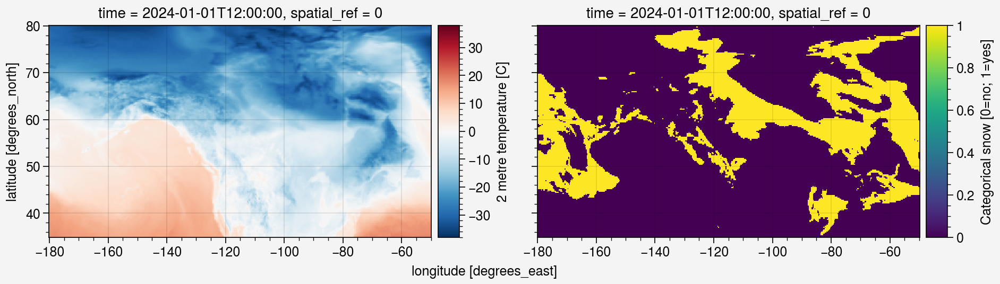

In [8]:
fig, axes = uplt.subplots(ncols=2, refwidth=3.6, refheight=2)

d = ds_local.sel(time="2024-01-01 12:00:00")

d.temperature_2m.plot.imshow(ax=axes[0])
d.categorical_snow_surface.plot.imshow(ax=axes[1])

In [154]:
gdf_region3b = gpd.read_file("region3b_v1_23Jul2025.json")
gdf_region3b.head()

,frame_id,region_name,priority,orbit_pass,sensing_time_count,burst_id_count,geometry
0,834,District of Columbia,3.0,ASCENDING,228,27,"POLYGON ((-78.89908 38.96822, -76.04724 39.481..."
1,2813,Panama,3.0,DESCENDING,233,16,"POLYGON ((-82.94558 8.69691, -82.6391 10.23253..."
2,2814,Costa Rica,3.0,DESCENDING,233,20,"POLYGON ((-83.21265 7.36563, -82.90446 8.90121..."
3,2815,Panama,3.0,DESCENDING,175,2,"POLYGON ((-83.48216 6.03453, -83.17152 7.56992..."
4,4838,Panama,3.0,ASCENDING,21,17,"POLYGON ((-82.13241 6.31472, -82.44824 7.8443,..."


In [155]:
gdf_frames = opera_utils.get_frame_geodataframe()

gdf_priority = gpd.read_file("NApriorityrollout_framebased_v8_13Mar2025.json")
gdf_priority = gdf_priority[gdf_priority.priority == 4]
gdf_priority = pd.concat([gdf_priority, gdf_region3b])

gdf_priority = pd.merge(
    gdf_priority, gdf_frames, left_on="frame_id", right_index=True, suffixes=("", "_2")
)
gdf_priority = gdf_priority.drop(["orbit_pass_2", "geometry_2"], axis=1).reset_index(
    drop=True
)
gdf_priority

,frame_id,region_name,priority,orbit_pass,geometry,sensing_time_count,burst_id_count,is_land,is_north_america
0,18899,Nevada,4.0,DESCENDING,"POLYGON ((-117.96073 39.89376, -117.64143 41.4...",NaN,NaN,1,True
1,18900,Nevada,4.0,DESCENDING,"POLYGON ((-118.23262 38.56823, -117.91803 40.0...",NaN,NaN,1,True
2,18901,Nevada,4.0,DESCENDING,"POLYGON ((-118.50179 37.24224, -118.1904 38.77...",NaN,NaN,1,True
3,18898,Nevada,4.0,DESCENDING,"POLYGON ((-117.68467 41.21868, -117.36242 42.7...",NaN,NaN,1,True
4,38498,Nevada,4.0,DESCENDING,"POLYGON ((-119.78701 41.00326, -119.46547 42.5...",NaN,NaN,1,True
...,...,...,...,...,...,...,...,...,...
924,44042,Honduras,3.0,ASCENDING,"POLYGON ((-87.43321 12.08385, -87.74766 13.613...",237.0,27.0,1,True
925,44043,Honduras,3.0,ASCENDING,"POLYGON ((-88.02247 14.9476, -85.74403 15.5039...",236.0,27.0,1,True
926,44044,Honduras,3.0,ASCENDING,"POLYGON ((-87.98228 14.75272, -88.29771 16.281...",237.0,21.0,1,True
927,44045,Belize,3.0,ASCENDING,"POLYGON ((-88.57354 17.61579, -86.26118 18.166...",236.0,7.0,1,True


In [18]:
import snow_month_filter as smf

In [13]:
%%time

agg = smf.aggregate_weather(ds_local, win="1W")  # or win=72 for hourly roll
agg

CPU times: user 4.65 s, sys: 2.93 s, total: 7.58 s
Wall time: 7.61 s


<xarray.Dataset> Size: 330MB
Dimensions:      (longitude: 521, latitude: 181, time: 292)
Coordinates:
    spatial_ref  int64 8B 0
  * longitude    (longitude) float64 4kB -180.0 -179.8 -179.5 ... -50.25 -50.0
  * latitude     (latitude) float64 1kB 80.0 79.75 79.5 ... 35.5 35.25 35.0
  * time         (time) datetime64[ns] 2kB 2020-01-05 2020-01-12 ... 2025-08-03
Data variables:
    snow         (time, latitude, longitude) float32 110MB 3.0 3.0 ... 0.0 0.0
    tmin         (time, latitude, longitude) float32 110MB -30.67 ... 24.38
    tmax         (time, latitude, longitude) float32 110MB -22.73 ... 26.14

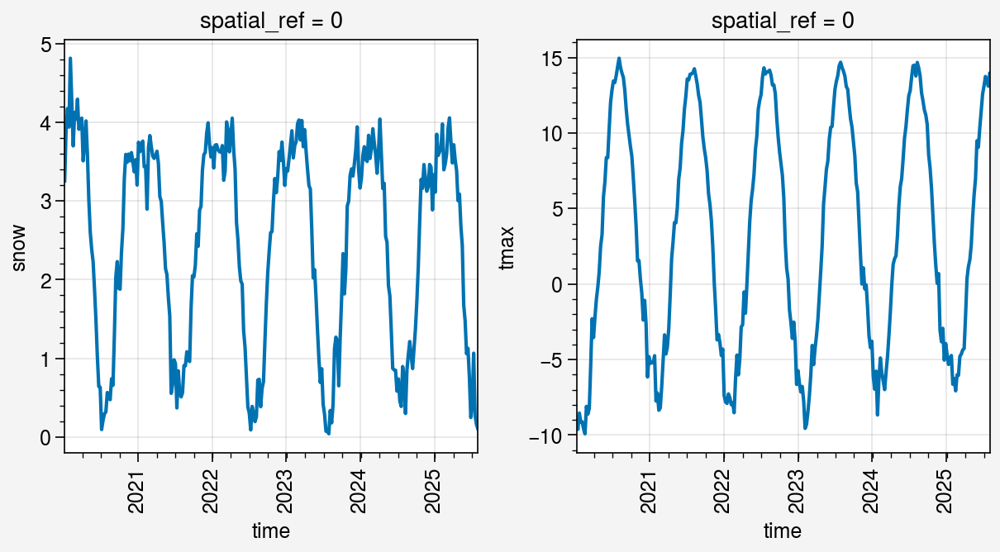

In [16]:
fig, axes = uplt.subplots(ncols=2, share=False)
for ax, var in zip(axes, ["snow", "tmax"]):
    agg[var].mean(dim=("longitude", "latitude")).plot(ax=ax)

In [19]:
agg.tmax.hvplot.quadmesh(x="longitude", y="latitude")

/u/aurora-r0/staniewi/miniconda3/envs/mapping-311/lib/python3.11/site-packages/holoviews/core/util.py:1175: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  return pd.unique(values)


:DynamicMap   [time]
   :QuadMesh   [longitude,latitude]   (tmax)

In [24]:
rows = []
total_cells = agg.tmax.size
print(f"{total_cells} total cells"),
for combine in ["or", "and"]:
    for snow_threshold in [3, 5, 7]:
        for freezing_threshold in [0, -3, -5]:
            mask = smf.bad_month_mask(
                agg,
                snow_threshold=snow_threshold,
                freezing_threshold=freezing_threshold,
                combine=combine,
            )
            total_masked = mask.sum().item()
            pct = total_masked / total_cells
            print(
                f"{snow_threshold = }, {freezing_threshold = }, {combine = }, {total_masked} masked ({100 * pct:.2f}%)"
            )
            rows.append((combine, snow_threshold, freezing_threshold, pct))

27535892 total cells

snow_threshold = 3, freezing_threshold = 0, combine = 'or', 13613747 masked (49.44%)

snow_threshold = 3, freezing_threshold = -3, combine = 'or', 13337848 masked (48.44%)

snow_threshold = 3, freezing_threshold = -5, combine = 'or', 13234172 masked (48.06%)

snow_threshold = 5, freezing_threshold = 0, combine = 'or', 11732884 masked (42.61%)

snow_threshold = 5, freezing_threshold = -3, combine = 'or', 10981031 masked (39.88%)

snow_threshold = 5, freezing_threshold = -5, combine = 'or', 10670282 masked (38.75%)

snow_threshold = 7, freezing_threshold = 0, combine = 'or', 10359941 masked (37.62%)

snow_threshold = 7, freezing_threshold = -3, combine = 'or', 8811357 masked (32.00%)

snow_threshold = 7, freezing_threshold = -5, combine = 'or', 8146152 masked (29.58%)

snow_threshold = 3, freezing_threshold = 0, combine = 'and', 8185616 masked (29.73%)

snow_threshold = 3, freezing_threshold = -3, combine = 'and', 6334159 masked (23.00%)

snow_threshold = 3, freezing_threshold = -5, combine = 'and', 5525284 masked (20.07%)

snow_threshold = 5, freezing_threshold = 0, combine = 'and', 5629936 masked (20.45%)

snow_threshold = 5, freezing_threshold = -3, combine = 'and', 4254433 masked (15.45%)

snow_threshold = 5, freezing_threshold = -5, combine = 'and', 3652631 masked (13.26%)

snow_threshold = 7, freezing_threshold = 0, combine = 'and', 1995357 masked (7.25%)

snow_threshold = 7, freezing_threshold = -3, combine = 'and', 1416585 masked (5.14%)

snow_threshold = 7, freezing_threshold = -5, combine = 'and', 1169239 masked (4.25%)

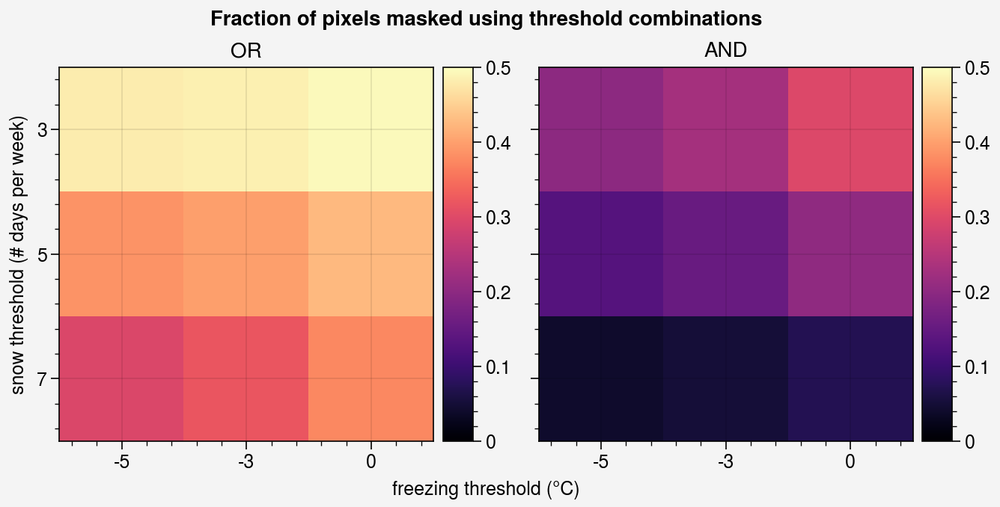

In [27]:
df = pd.DataFrame(rows, columns=["combine", "snow", "freeze", "pct"])
# ------------------------------------------------------------
# 1.  Facet grid: 2 regions x 2 logic operators
fig, axes = uplt.subplots(ncols=2)

for (combine,), sub in df.groupby(["combine"]):
    ax = axes[0, 0 if combine == "or" else 1]

    # pivot to a matrix (rows = snow threshold, cols = freeze threshold)
    mat = sub.pivot(index="snow", columns="freeze", values="pct")
    im = ax.imshow(mat, aspect="auto", cmap="magma", vmin=0, vmax=0.5, colorbar=True)

    # # annotate each cell with the % masked
    # for i, snow in enumerate(mat.index):
    #     for j, frz in enumerate(mat.columns):
    #         ax.text(
    #             j, i, f"{mat.at[snow, frz]:.0f}%", ha="center", va="center", fontsize=8
    #         )

    ax.set_title(f"{combine.upper()}", fontsize=10, pad=4)
    ax.set_xticks(range(len(mat.columns)), mat.columns)
    ax.set_yticks(range(len(mat.index)), mat.index)
    ax.set_xlabel("freezing threshold (°C)")
    ax.set_ylabel("snow threshold (# days per week)")

# # colour-bar
# cbar = fig.colorbar(
#     im, ax=axes, shrink=0.8, label="% of grid flagged bad"
# )
fig.suptitle("Fraction of pixels masked using threshold combinations")
plt.show()

In [56]:
mask_3_0 = mask = smf.bad_month_mask(
    agg, snow_threshold=3, freezing_threshold=0, combine="or"
)
mask_4_3 = smf.bad_month_mask(
    agg, snow_threshold=4, freezing_threshold=-3, combine="or"
)
mask.size, mask.sum().item()

(27535892, 13613747)

In [34]:
# demonstrate on oregon frame
g1 = gdf_priority[gdf_priority.frame_id == 30710].iloc[0].geometry
smf._subset_mask_to_frame(mask, g1).hvplot.quadmesh(
    x="longitude", y="latitude", clim=(0, 1)
)

/u/aurora-r0/staniewi/miniconda3/envs/mapping-311/lib/python3.11/site-packages/holoviews/core/util.py:1175: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  return pd.unique(values)


:DynamicMap   [time]
   :QuadMesh   [longitude,latitude]   (value)

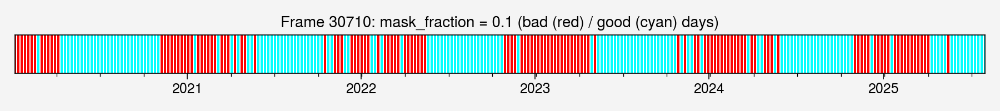

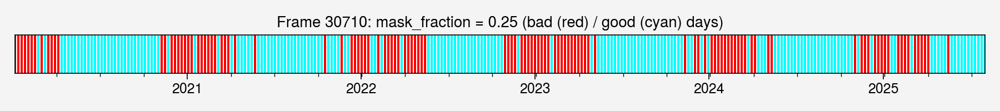

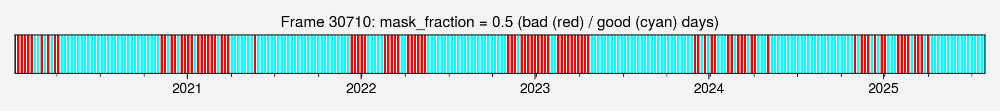

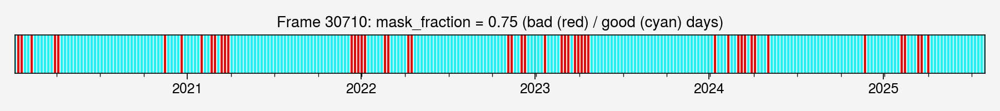

In [46]:
for mask_fraction in [0.1, 0.25, 0.5, 0.75]:
    # print(f"{mask_fraction = }")
    smf.plot_frame_timeline(
        30710,
        smf.bad_month_mask(agg, snow_threshold=3, freezing_threshold=0, combine="or"),
        gdf_priority,
        mask_fraction=mask_fraction,
    )
    plt.show()

In [87]:
# frame_id = 17235  # top of AK
# frame_id = 9451  # top of AK
frame_id = 30710  # three sisters
# frame_id = 42261 # new mexico

poly = gdf_priority.loc[gdf_priority.frame_id == frame_id, "geometry"].iloc[0]
frac = smf.daily_bad_fraction(mask, poly)  # Series indexed by date
frac

time
2020-01-05    0.666667
2020-01-12    0.807692
2020-01-19    0.987179
2020-01-26    0.666667
2020-02-02    0.666667
                ...   
2025-07-06    0.000000
2025-07-13    0.000000
2025-07-20    0.000000
2025-07-27    0.000000
2025-08-03    0.000000
Freq: W-SUN, Length: 292, dtype: float64

<Axes: xlabel='time'>

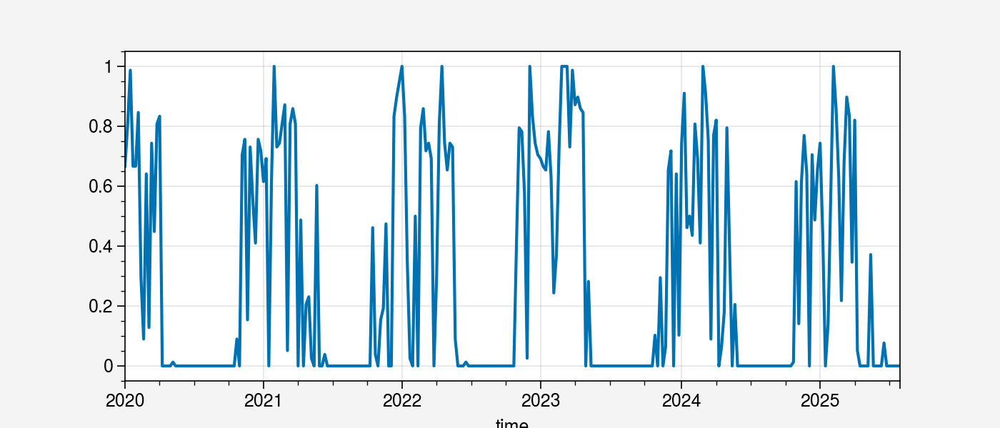

In [88]:
frac.plot(figsize=(7, 3))

<Axes: xlabel='time'>

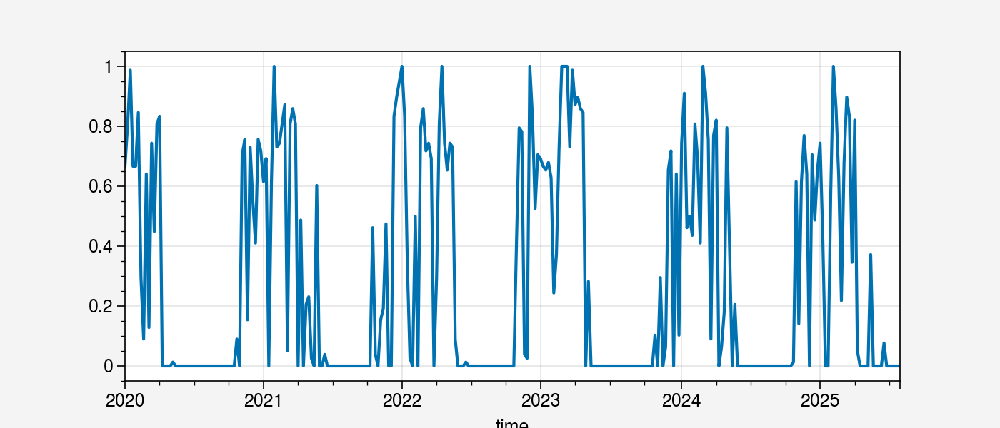

In [107]:
mm = smf.bad_month_mask(agg, snow_threshold=3, freezing_threshold=-3, combine="or")
# frame_id = 9451  # top of AK

poly = gdf_priority.loc[gdf_priority.frame_id == frame_id, "geometry"].iloc[0]
frac = smf.daily_bad_fraction(mm, poly)
frac.plot(figsize=(7, 3))

In [121]:
runs = smf.get_annual_seasons(frac, mask_fraction=0.3)
runs

[(Timestamp('2020-01-05 00:00:00'), Timestamp('2020-04-05 00:00:00')),
 (Timestamp('2020-11-08 00:00:00'), Timestamp('2021-05-23 00:00:00')),
 (Timestamp('2021-10-17 00:00:00'), Timestamp('2022-05-15 00:00:00')),
 (Timestamp('2022-10-30 00:00:00'), Timestamp('2023-04-23 00:00:00')),
 (Timestamp('2023-12-03 00:00:00'), Timestamp('2024-05-12 00:00:00')),
 (Timestamp('2024-11-03 00:00:00'), Timestamp('2025-05-18 00:00:00'))]

In [122]:
print(smf.summarize_blackouts(runs, mode="aggressive"))
print(smf.summarize_blackouts(runs, mode="median"))
print(smf.summarize_blackouts(runs, mode="conservative"))

(Timestamp('2001-01-05 00:00:00'), Timestamp('2001-04-05 00:00:00'))

(Timestamp('2000-11-08 00:00:00'), Timestamp('2001-05-15 00:00:00'))

(Timestamp('2000-10-17 00:00:00'), Timestamp('2001-05-23 00:00:00'))

In [145]:
frame_id = 17235  # top of AK
# frame_id = 9451  # top of AK
# frame_id = 30710 # three sisters
# frame_id = 42261 # new mexico

smf.get_blackout_windows(
    agg.sel(time=slice("2020-05-01", None)),
    gdf_priority,
    snow_threshold=5,
    frame_id=frame_id,
).T

Processing frames:   0%|          | 0/1 [00:00<?, ?it/s]

,0
frame_id,17235
mask_fraction,0.5
snow_threshold,5
freezing_threshold,-2
start_aggressive,2001-05-03 00:00:00
end_aggressive,2001-05-17 00:00:00
start_median,2000-09-29 00:00:00
end_median,2001-05-30 00:00:00
start_conservative,2000-09-24 00:00:00
end_conservative,2001-06-08 00:00:00


In [156]:
df_total = smf.get_blackout_windows(
    agg.sel(time=slice("2020-05-01", None)),
    gdf_priority,
    snow_threshold=5,
)

Processing frames:   0%|          | 0/929 [00:00<?, ?it/s]

No mask found for frame 27482; skipping
No mask found for frame 19696; skipping
No mask found for frame 19695; skipping
No mask found for frame 41117; skipping
No mask found for frame 41118; skipping
No mask found for frame 2813; skipping
No mask found for frame 2814; skipping
No mask found for frame 2815; skipping
No mask found for frame 4838; skipping
No mask found for frame 4839; skipping
No mask found for frame 4840; skipping
No mask found for frame 4842; skipping
No mask found for frame 4843; skipping
No mask found for frame 4844; skipping
No mask found for frame 4846; skipping
No mask found for frame 6834; skipping
No mask found for frame 6836; skipping
No mask found for frame 6837; skipping
No mask found for frame 8870; skipping
No mask found for frame 8871; skipping
No mask found for frame 10599; skipping
No mask found for frame 10600; skipping
No mask found for frame 10601; skipping
No mask found for frame 12624; skipping
No mask found for frame 12625; skipping
No mask found f

In [175]:
gdf_total = pd.merge(gdf_priority, df_total, left_on="frame_id", right_on="frame_id")
gdf_total["blackout_duration_aggressive"] = np.abs(
    gdf_total["start_aggressive"] - gdf_total["end_aggressive"]
).dt.days
gdf_total["blackout_duration_median"] = np.abs(
    gdf_total["start_median"] - gdf_total["end_median"]
).dt.days
gdf_total["blackout_duration_conservative"] = np.abs(
    gdf_total["start_conservative"] - gdf_total["end_conservative"]
).dt.days

In [178]:
gdf_total.explore(column="blackout_duration_median", cmap="RdBu_r")

In [187]:
import folium


def explore(gdf_total, column, cmap="RdBu_r"):

    m = folium.Map()

    # Create separate layers for each orbit pass type
    ascending = gdf_total[gdf_total["orbit_pass"] == "ASCENDING"]
    descending = gdf_total[gdf_total["orbit_pass"] == "DESCENDING"]

    # Add layers with different colors
    ascending.explore(
        m=m, cmap=cmap, column=column, name="ASCENDING", style_kwds={"fillOpacity": 0.7}
    )

    descending.explore(
        m=m,
        cmap=cmap,
        column=column,
        name="DESCENDING",
        style_kwds={"fillOpacity": 0.7},
        legend=False,
    )

    # Add layer control
    folium.LayerControl().add_to(m)
    return m

In [188]:
explore(gdf_total, "blackout_duration_aggressive")

In [189]:
explore(gdf_total, "blackout_duration_median")

In [190]:
explore(gdf_total, "blackout_duration_conservative")

In [191]:
gdf_total.to_file("opera-region4-snow-analysis.geojson")
gdf_total.to_parquet("opera-region4-snow-analysis.parquet")